<a href="https://colab.research.google.com/github/gabrieldimas/simbesi-scholarship-decision-support-system/blob/machine-learning/pcvk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from PIL import Image
from sklearn.cluster import KMeans

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:

folder_path = '/content/drive/MyDrive/dataset ktm'

(959, 1600, 3)


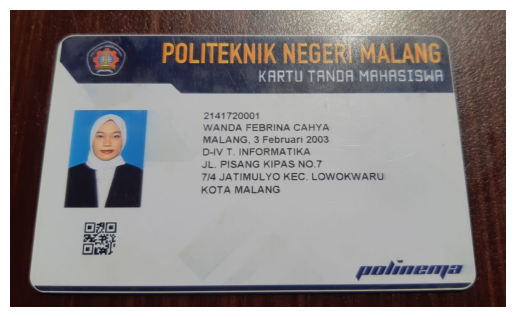

(1053, 1599, 3)


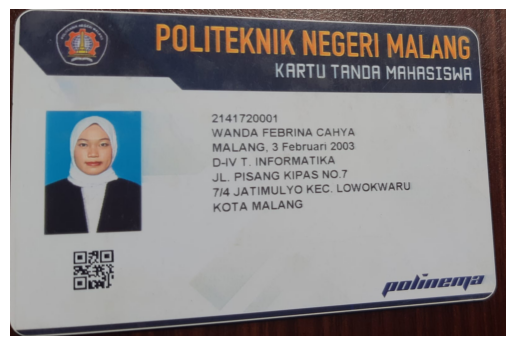

(969, 1447, 3)


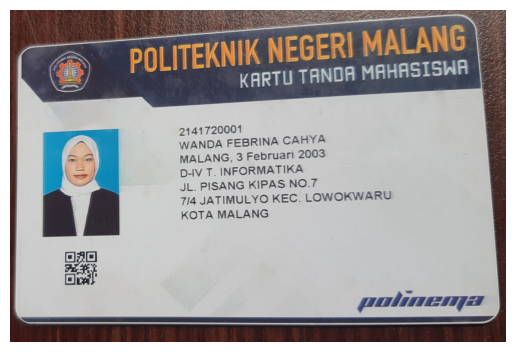

(956, 1600, 3)


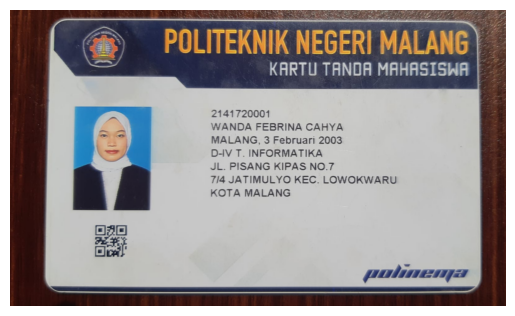

(990, 1600, 3)


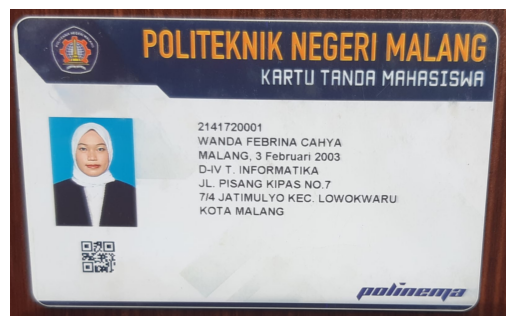

In [4]:

ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

ktp_files = sorted(ktp_files)

# Iterasi pada gambar-gambar KTP
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)
    print(ktp_image.shape)

    # Tampilkan gambar
    plt.figure()
    plt.axis('off')
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.show()

# Data Preprocessing

In [5]:
#pre processing
def detect_cards(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.blur(gray, (7, 7))
    lt = 900
    edged = cv2.Canny(gray, lt, lt * 3)

    return edged

def proccess_card(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

    return image

def order_points(pts):
  rect = np.zeros((4, 2), dtype = "float32")
  s = pts.sum(axis = 1)
  rect[0] = pts[np.argmin(s)]
  rect[2] = pts[np.argmax(s)]
  diff = np.diff(pts, axis = 1)
  rect[1] = pts[np.argmin(diff)]
  rect[3] = pts[np.argmax(diff)]
  return rect

def four_point_transform(image, pts):
  rect = order_points(pts)
  (tl, tr, br, bl) = rect
  widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
  widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
  maxWidth = max(int(widthA), int(widthB))
  heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
  heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
  maxHeight = max(int(heightA), int(heightB))
  dst = np.array([
    [0, 0],
    [maxWidth - 1, 0],
    [maxWidth - 1, maxHeight - 1],
    [0, maxHeight - 1]], dtype = "float32")
  M = cv2.getPerspectiveTransform(rect, dst)
  warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
  return warped

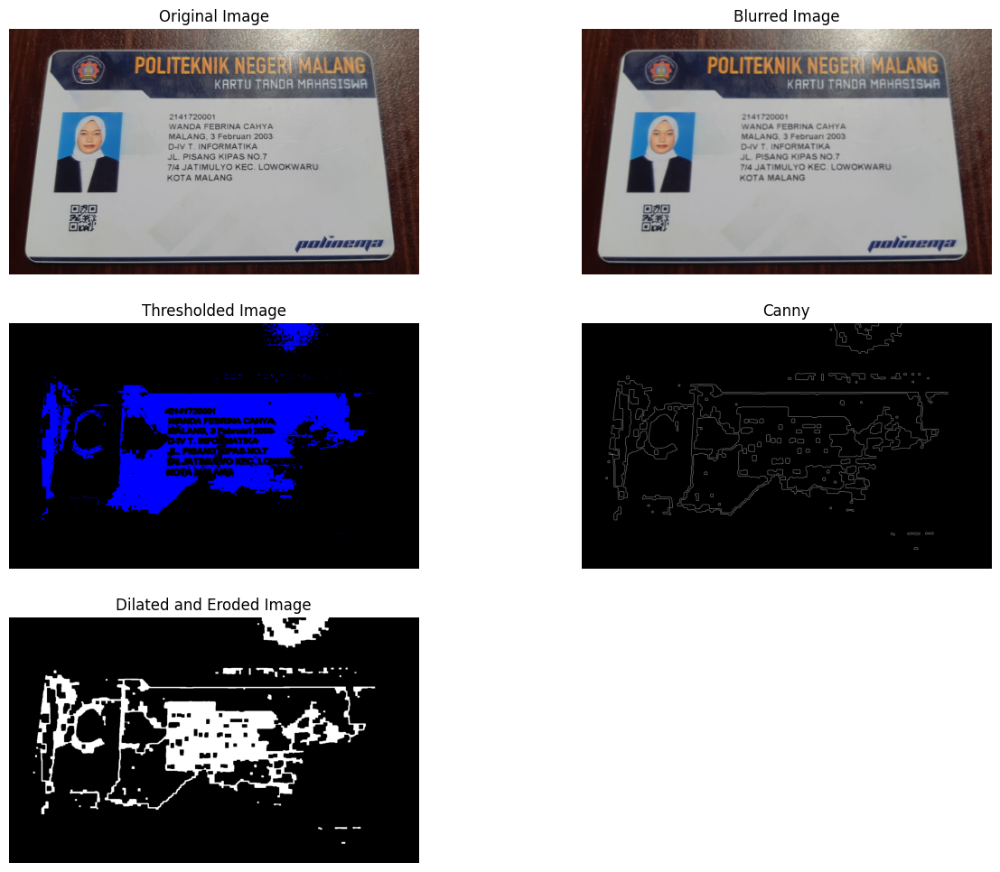

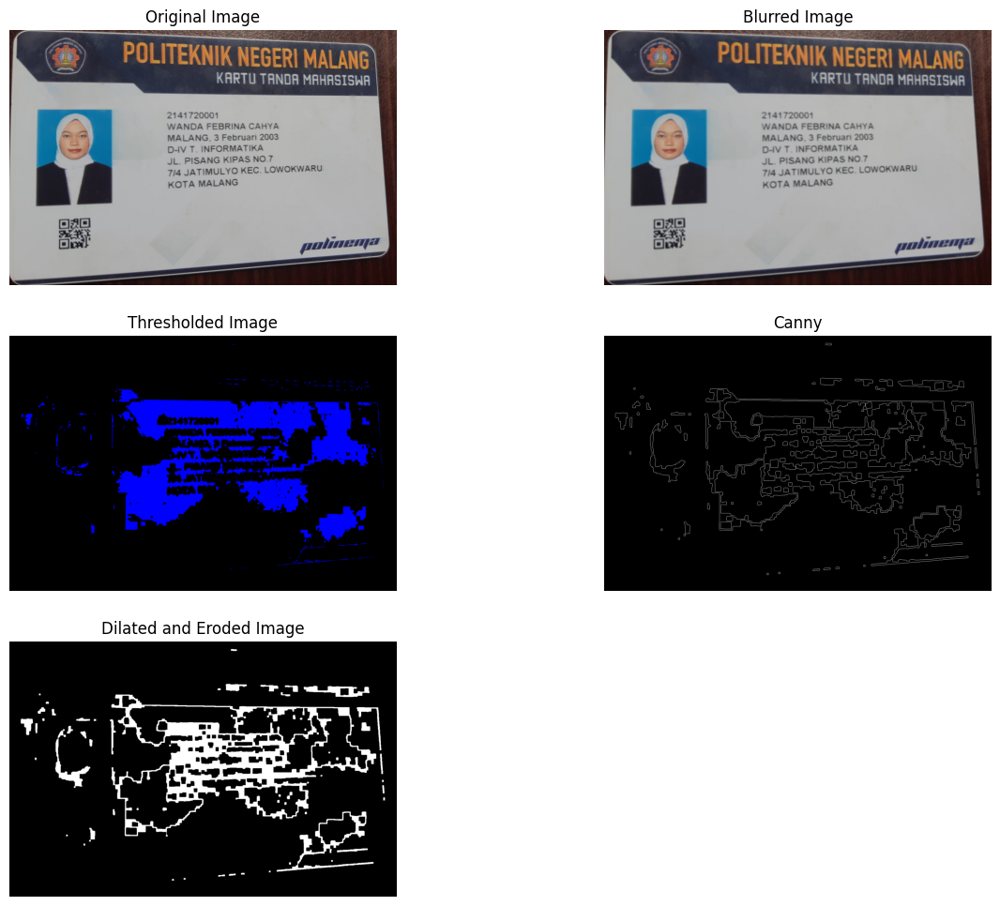

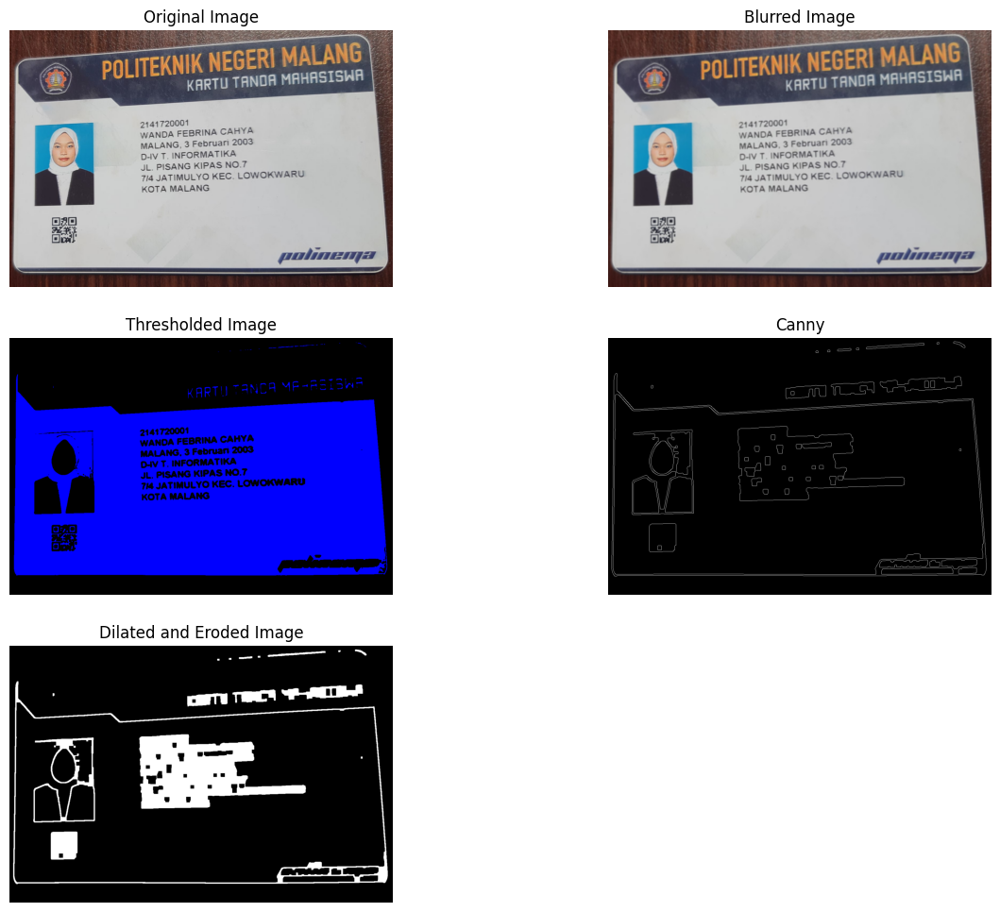

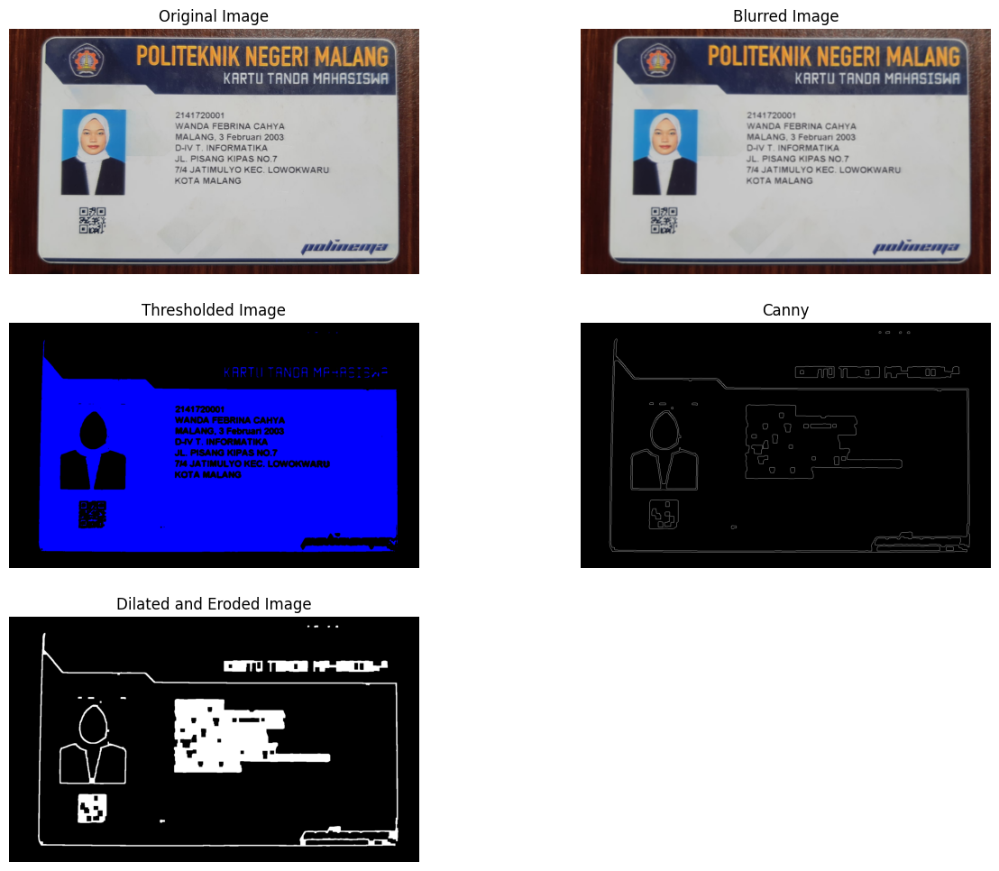

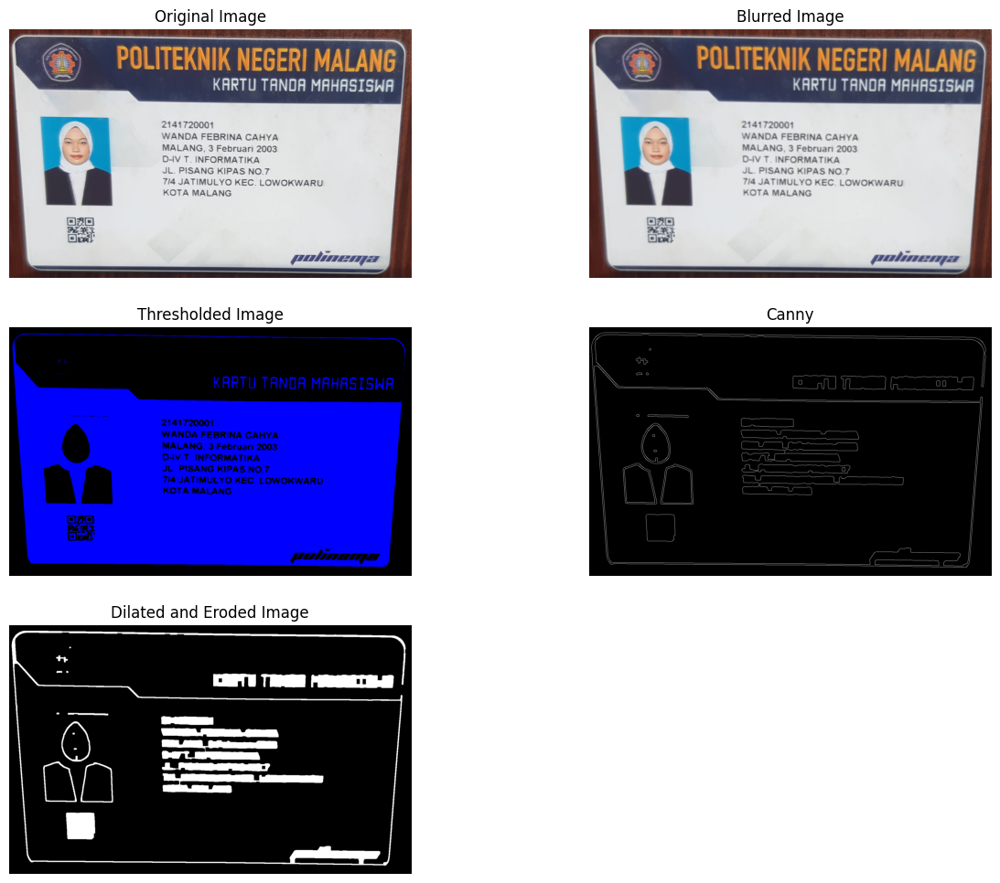

In [6]:
# Iterasi pada gambar-gambar KTP
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    blur = cv2.blur(ktp_image, (5,5))
    _, mask = cv2.threshold(blur, 180, 255, cv2.THRESH_BINARY)
    mask[:,:,1] = 0
    mask[:,:,2] = 0

    lt = 50
    edges = cv2.Canny(mask, lt, lt * 3)

    kernel = np.ones((5, 5), np.uint8)

    dilatation_dst = cv2.dilate(edges, kernel , iterations=4)
    erosion = cv2.erode(dilatation_dst,kernel,iterations = 3)

    # Deteksi tepi menggunakan Canny
    edges = cv2.Canny(erosion, 50, 150)

    plt.figure(figsize=(15, 12))

    plt.subplot(3, 2, 1)
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 2, 2)
    plt.imshow(cv2.cvtColor(blur, cv2.COLOR_BGR2RGB))
    plt.title('Blurred Image')
    plt.axis('off')

    plt.subplot(3, 2, 3)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title('Thresholded Image')
    plt.axis('off')

    plt.subplot(3, 2, 5)
    plt.imshow(cv2.cvtColor(erosion, cv2.COLOR_BGR2RGB))
    plt.title('Dilated and Eroded Image')
    plt.axis('off')

    plt.subplot(3, 2, 4)
    plt.imshow(cv2.cvtColor(edges, cv2.COLOR_BGR2RGB))
    plt.title('Canny')
    plt.axis('off')

    plt.show()

In [116]:
import cv2
import os
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Function to perform k-means clustering
def kmeans_clustering(image, k=2):
    pixel_val = image.reshape((-1, 3))
    pixel_val = np.float32(pixel_val)

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    _, labels, centers = cv2.kmeans(pixel_val, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    centers = np.uint8(centers)
    labels = labels.flatten()
    segmented_img = centers[labels.flatten()]
    segmented_img = segmented_img.reshape(image.shape)

    return segmented_img

# Function to perform edge detection and template matching
def edge_detection_and_matching(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0.5)

    edges = cv2.Canny(blur, 50, 150)

    ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    erode = cv2.erode(bw.copy(), cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

    # Ekstraksi kontur
    contours, hierarchy = cv2.findContours(erode.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # Loop through contours for bounding boxes
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        ras = format(w / h, '.2f')
        if h >= 40 and w >= 10 and float(ras) <= 1:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
        elif h >= 20 and w >= 5 and float(ras) <= 1:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
        elif h >= 10 and w >= 5 and float(ras) <= 1:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

    max_area = 0
    best_rect = None

    for contour in contours:
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)

        if len(approx) == 4:
            area = cv2.contourArea(approx)
            if area > max_area:
                max_area = area
                best_rect = approx

    return best_rect

# Function to process each image
def process_image(ktp_image, image_index):
    # K-means clustering
    segmented_img = kmeans_clustering(ktp_image)

    # Edge detection and template matching
    best_rect = edge_detection_and_matching(ktp_image)

    # Draw rectangles on the original image
    for rect in [best_rect]:
        if rect is not None:
            cv2.drawContours(ktp_image, [rect], -1, (0, 255, 0), 4)

    # Warping the image
    warped = four_point_transform(ktp_image, best_rect.reshape(4, 2))

    # Display results
    plt.figure(figsize=(15, 12))

    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Image Contour {image_index}')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    plt.title('Image Transformation')
    plt.axis('off')

    return warped


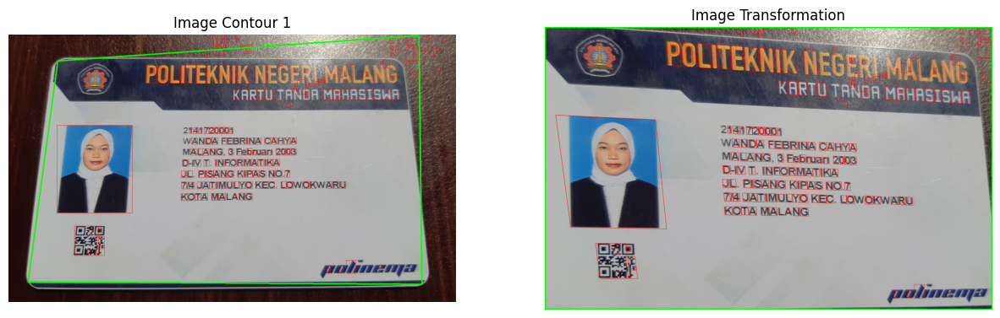

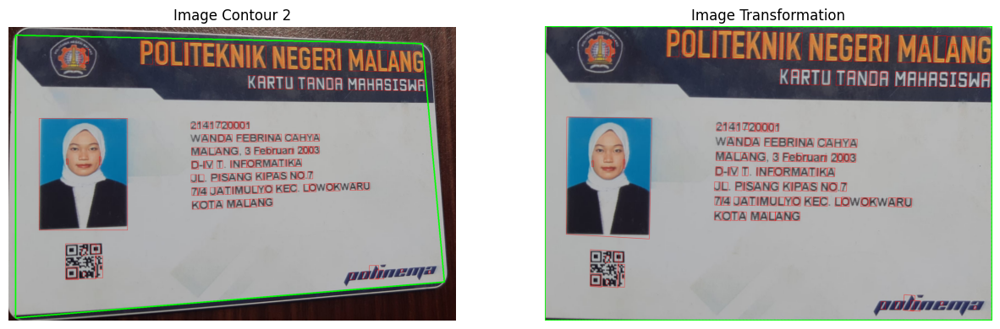

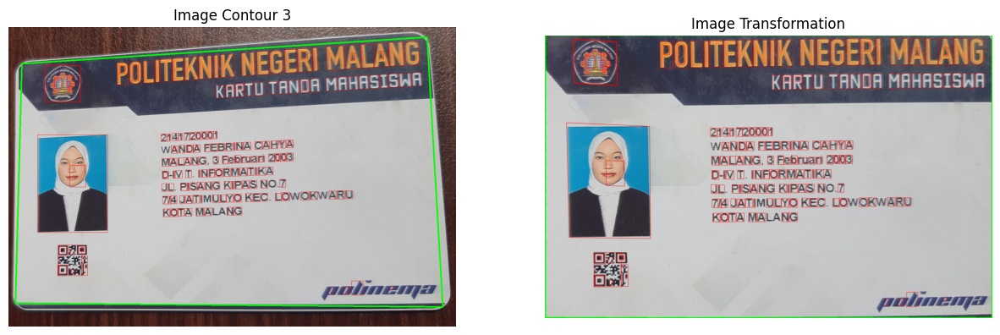

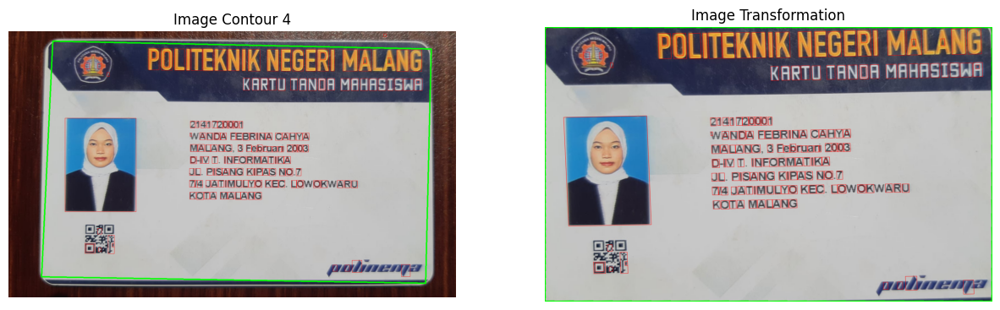

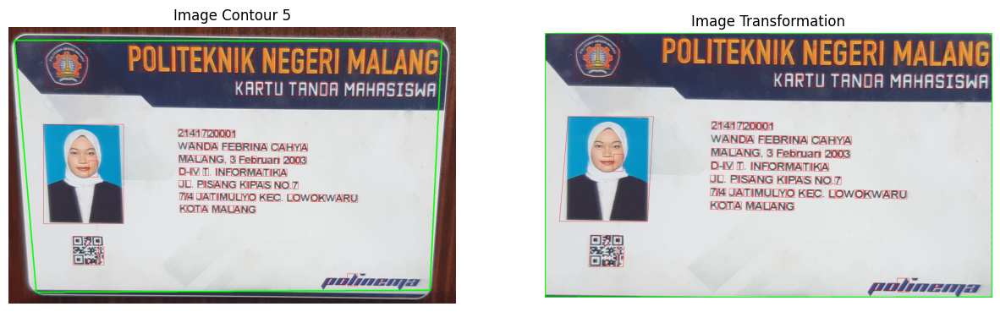

In [50]:
# Main code
cropped_images = []

for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    # Process each image
    warped_image = process_image(ktp_image, i + 1)

    cropped_images.append(warped_image)


# H5 coba 1 gambar

In [117]:

import numpy as np
import imutils
import cv2
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
from google.colab.patches import cv2_imshow

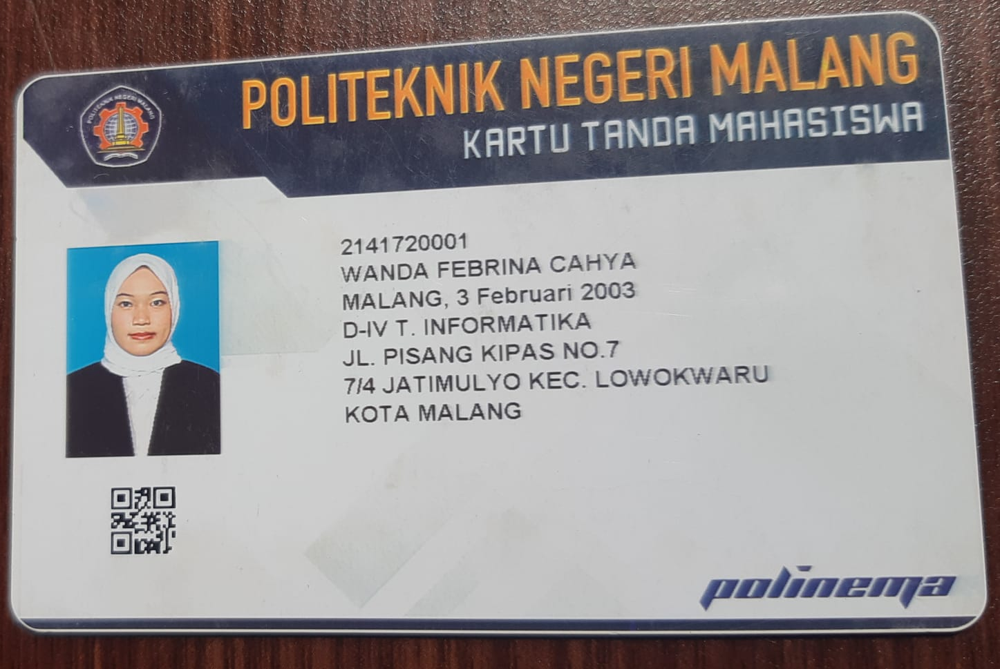

In [144]:
img_border = cv2.imread('/content/drive/MyDrive/dataset ktm/WhatsApp Image 2023-12-05 at 12.10.55 PM (1).jpeg')
cv2_imshow(img_border)

In [145]:
# Create simple pre-processing method
def preprocess_img(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (3,3), 7)
  edges = cv2.Canny(blur, 40, 150)
  dilation = cv2.dilate(edges, np.ones((3,3)))

  return gray, dilation


# Prediction
def prediction(preds, char_list):
  i = np.argmax(preds)
  prop = preds[i]
  char_detect = char_list[i]

  return i, prop, char_detect

# Draw char on image
def draw_img(img_cp, char):
  cv2.rectangle(img_cp, (x, y), (x + w, y + h), (255, 0, 0), 2)
  cv2.putText(img_cp, char, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255),2)



In [161]:
# Function to perform k-means clustering
def kmeans_clustering(image, k=2):
    pixel_val = image.reshape((-1, 3))
    pixel_val = np.float32(pixel_val)

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    _, labels, centers = cv2.kmeans(pixel_val, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    centers = np.uint8(centers)
    labels = labels.flatten()
    segmented_img = centers[labels.flatten()]
    segmented_img = segmented_img.reshape(image.shape)

    return segmented_img

# Function to perform edge detection and template matching
def edge_detection_and_matching(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0.5)

    edges = cv2.Canny(blur, 50, 150)

    ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    erode = cv2.erode(bw.copy(), cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

    # Ekstraksi kontur
    contours, hierarchy = cv2.findContours(erode.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # Loop through contours for bounding boxes
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        ras = format(w / h, '.2f')
        if h >= 40 and w >= 10 and float(ras) <= 1:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
        elif h >= 20 and w >= 5 and float(ras) <= 1:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
        elif h >= 10 and w >= 5 and float(ras) <= 1:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

    max_area = 0
    best_rect = None

    for contour in contours:
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)

        if len(approx) == 4:
            area = cv2.contourArea(approx)
            if area > max_area:
                max_area = area
                best_rect = approx

    return best_rect

# Function to process each image
def process_image(ktp_image):
    # K-means clustering
    segmented_img = kmeans_clustering(ktp_image)

    # Edge detection and template matching
    best_rect = edge_detection_and_matching(ktp_image)

    # Draw rectangles on the original image
    for rect in [best_rect]:
        if rect is not None:
            cv2.drawContours(ktp_image, [rect], -1, (0, 255, 0), 4)

    # Warping the image
    warped = four_point_transform(ktp_image, best_rect.reshape(4, 2))
    return warped

In [158]:
# Define function for contour detection
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method='left-to-right')[0]

  return conts

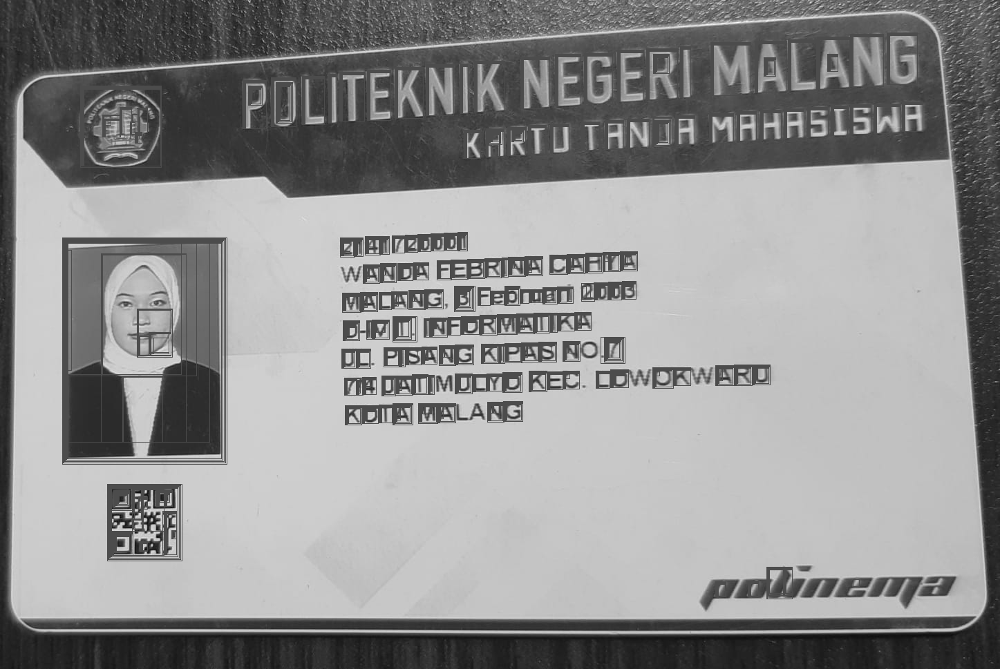

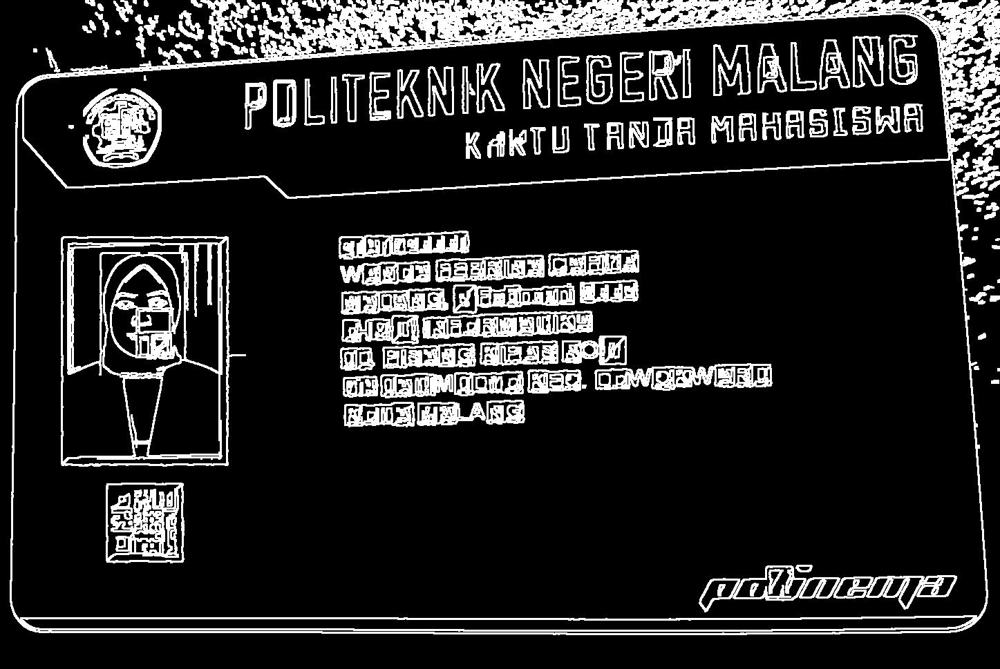

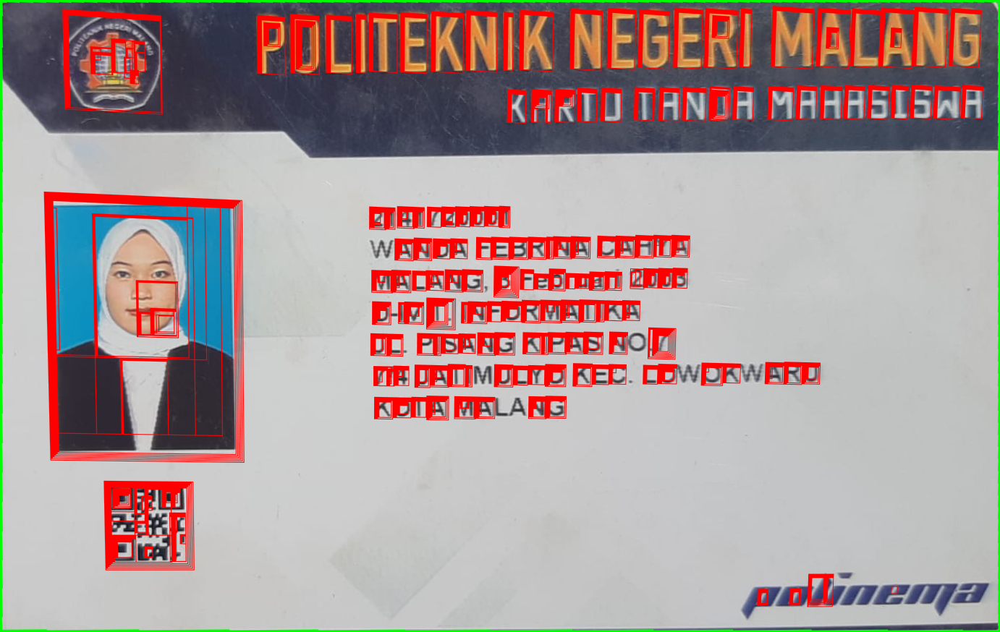

In [162]:
gray, prep_img = preprocess_img(img_border)
warped_img = process_image(img_border)
cv2_imshow(gray) # show gray
cv2_imshow(prep_img) # show img after several preprocessing
cv2_imshow(warped_img)

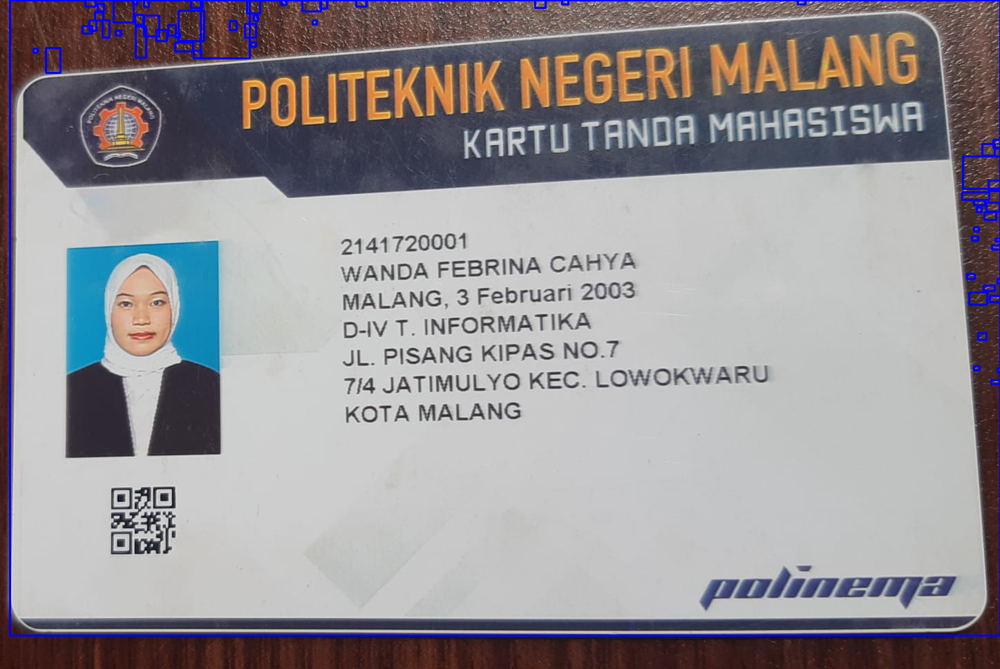

In [73]:
# Check contour
conts_border = find_contours(prep_img.copy())

img_cp = img_border.copy()
for c in conts_border:
  (x, y, w, h) = cv2.boundingRect(c)
  roi = gray[y:y+h, x:x+w]
  thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  # draw detected contour
  cv2.rectangle(img_cp, (x, y), (x + w, y + h), (255,0,0), 2)
cv2_imshow(img_cp)

In [74]:

# Check detected contour

height, width = img_border.shape[:2]
print(height, width)

# Sort contours from the largest one
contours_size = sorted(conts_border, key=cv2.contourArea, reverse=True)
contours_size

969 1447


[array([[[417,   0]],
 
        [[417,   1]],
 
        [[416,   2]],
 
        ...,
 
        [[421,   3]],
 
        [[422,   2]],
 
        [[422,   0]]], dtype=int32),
 array([[[290,   0]],
 
        [[290,   2]],
 
        [[292,   2]],
 
        [[293,   3]],
 
        [[295,   3]],
 
        [[296,   4]],
 
        [[299,   4]],
 
        [[300,   5]],
 
        [[300,   6]],
 
        [[301,   7]],
 
        [[301,  11]],
 
        [[303,  11]],
 
        [[303,  10]],
 
        [[304,   9]],
 
        [[305,  10]],
 
        [[305,  12]],
 
        [[306,  13]],
 
        [[308,  13]],
 
        [[309,  14]],
 
        [[309,  16]],
 
        [[307,  18]],
 
        [[306,  18]],
 
        [[306,  21]],
 
        [[307,  22]],
 
        [[306,  23]],
 
        [[303,  23]],
 
        [[303,  28]],
 
        [[302,  29]],
 
        [[302,  34]],
 
        [[304,  34]],
 
        [[306,  36]],
 
        [[306,  50]],
 
        [[305,  51]],
 
        [[301,  51]],
 
        [[30

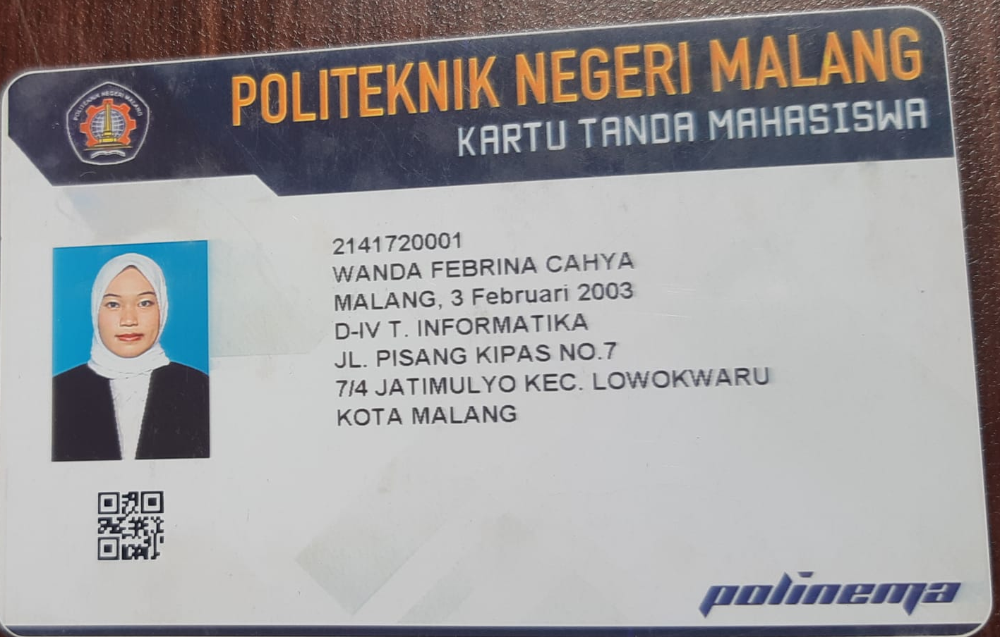

In [75]:

# Since we know our text placed in piece of paper
# just extract that area by crop it

for c in contours_size:
  (x, y, w, h) = cv2.boundingRect(c)

  if(w >= (width / 2)) and (h >= height / 2):
    cut_off = 8 # you can adjust it based on your images
    cut_img = img_border[y+cut_off:y + h - cut_off, x + cut_off: x + w - cut_off]
    cv2_imshow(cut_img)


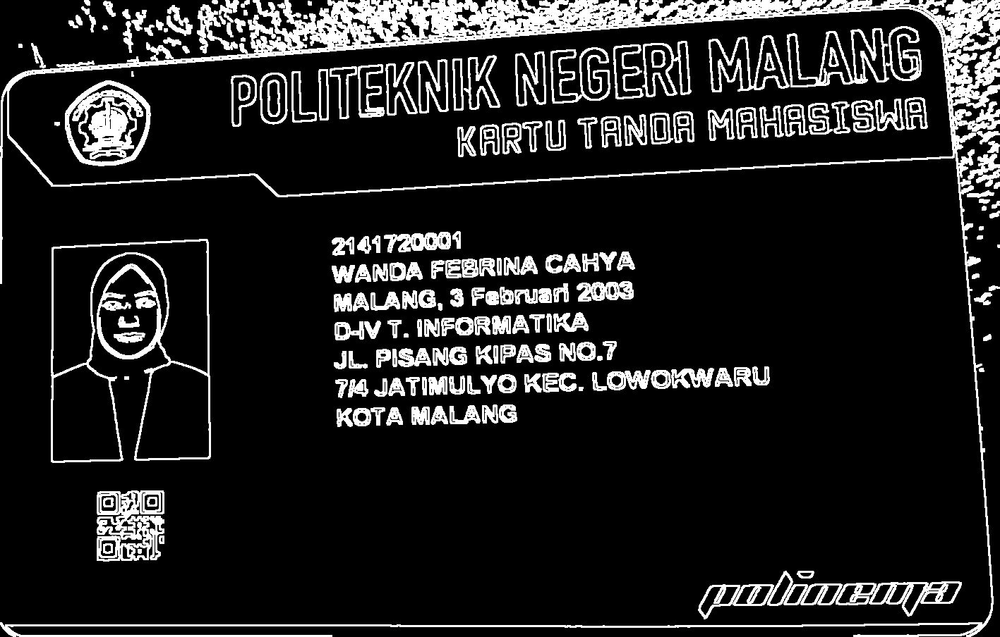

In [76]:

# do it again for cropped image

gray, prep_img = preprocess_img(cut_img)
cv2_imshow(prep_img)


In [87]:
# extract roi
def extract_roi(img):
  roi = img[y:y+h, x:x+w]

  return roi

In [88]:
# thresholding
def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  return thresh

In [89]:
# detection

def process_box(gray, x, y, w, h):

  roi = extract_roi(gray)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)

  # show result
  cv2_imshow(resized)

  normalized = normalization(resized)

  return (normalized, (x, y, w, h))

In [91]:
# Resizing
def resize_img(img, w, h):
  if w > h:
    resized = imutils.resize(img, width=28)
  else:
    resized = imutils.resize(img, height=28)

  # (w, h) = resized.shape
  (h, w) = resized.shape

  # Calculate how many pixels need to fill char image
  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))
  filled = cv2.resize(filled, (28,28))

  return filled

In [93]:
# normalization
def normalization(img):
  img = img.astype('float32') / 255.0 # convert to floating point
  img = np.expand_dims(img, axis=-1) # add depth
  return img

In [94]:
conts_cut = find_contours(prep_img.copy())
chars = []

for c in conts_cut:
  (x, y, w, h) = cv2.boundingRect(c)

  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    chars.append(process_box(gray, x, y, w, h))

boxes = [b[1] for b in chars]
pixels = np.array([p[0] for p in chars], dtype='float32')

preds = network.predict(pixels)

img_cp = cut_img.copy()
for (pred, (x, y, w, h)) in zip (preds, boxes):
  i, prop, ch = prediction(pred, char_list)
  draw_img(img_cp, ch)
cv2_imshow(img_cp)

NameError: ignored

In [ ]:

# Check detected contour

height, width = img_border.shape[:2]
print(height, width)

# Sort contours from the largest one
contours_size = sorted(conts_border, key=cv2.contourArea, reverse=True)
contours_size

In [41]:
# Import dataset mnist dari pustaka keras.datasets di TensorFlow
# Dataset MNIST merupakan dataset gambar digit tulisan tangan (0-9) yang umum digunakan untuk tugas-tugas pengenalan digit.
from tensorflow.keras.datasets import mnist

In [42]:
# Memuat data pelatihan dan label pelatihan, serta data uji dan label uji dari dataset mnist
# Fungsi load_data() secara otomatis membagi dataset menjadi data pelatihan dan uji
# train_data dan train_labels berisi data pelatihan dan label pelatihan, sedangkan test_data dan test_labels berisi data uji dan label uji
(train_data, train_labels), (test_data, test_labels) = mnist.load_data()

11490434/11490434 [==============================] - 0s 0us/step


In [43]:
# Memeriksa bentuk (shape) data pelatihan dan data uji
(train_data.shape, test_data.shape)

((60000, 28, 28), (10000, 28, 28))

In [44]:
# Memeriksa bentuk (shape) label pelatihan dan label uji
(train_labels.shape, test_labels.shape)

((60000,), (10000,))

In [45]:
# Memeriksa bentuk (shape) dari satu sampel data pelatihan, dimana seharusnya dimensi gambar adalah 28x28
train_data[0].shape

(28, 28)

In [46]:
# Memeriksa bentuk (shape) dari label pelatihan yang seharusnya hanya satu dimensi karena ini adalah masalah klasifikasi biner
train_labels.shape

(60000,)